# Postmodeling
write short note about this Notebook, what is the purpose of this notebook

In [1]:
# Mount google drive to run on Google Colab
# from google.colab import drive
# drive.mount('/content/drive')
# Change working directory
# import os
# os.chdir("/content/drive/My Drive/Dal - PhD/Metamodeling 2020/Python Codes 04.2021")
# !pwd

In [77]:
# Start with a clear environment
# Clear previous memories
from IPython import get_ipython
get_ipython().magic('reset -sf')
import random
random.seed(101) # reproducibility matters!

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import time

In [2]:
# Figure Quality related isseues
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi']= 600
plt.rcParams['savefig.dpi'] = 600

%config InlineBackend.figure_format = 'retina'

#sns.set(rc={"figure.dpi":1200, 'savefig.dpi':1200})
sns.set_style("white")


# Set figure paramaters
parameters = {'mathtext.default': 'regular','font.size': 12.0, 
          'font.family': ['Times New Roman'], 'axes.grid': False #, 'axes.facecolor': 'white' , 'axes.labelcolor': 'black' #, 
              #'font.style': 'oblique' #,  'font.size': 12.0,'axes.grid': False, ,
          #   'axes.edgecolor': 'grey', 
           #  'axes.labelcolor': 'black'
}
plt.rcParams.update(parameters)
sns.set(font_scale = 1.5)

#sns.set(rc=parameters)
#mpl.rcParams.update(mpl.rcParamsDefault)
#display(plt.rcParams.keys())
#sns.reset_defaults()

In [3]:
# Import Training & Test dataset
X_train_dev = pd.read_csv('Dataset for metamodeling/X_train_dev.csv', header=0).copy()
X_test = pd.read_csv('Dataset for metamodeling/X_test.csv', header=0).copy()
y_train_dev = pd.read_csv('Dataset for metamodeling/y_train_dev.csv', header=0).copy()
y_test = pd.read_csv('Dataset for metamodeling/y_test.csv', header=0).copy()

In [6]:
y_train_dev

,$volume_{oo.15min}$,$volume_{oo.60min}$,$volume_{oo.total}$,$height_{damage.ih}$,$length_{damage.ih}$,$height_{damage.oh}$,$length_{damage.oh}$
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000015,0.000000
1,0.000000,0.000000,0.000000,0.144635,0.228231,0.404948,0.356445
2,0.000000,0.000000,0.000000,0.032209,0.110172,0.294692,0.281351
3,0.243620,0.332105,0.332105,0.529583,0.380414,0.529583,0.378596
4,0.015976,0.015976,0.015976,0.217142,0.259830,0.426169,0.360246
...,...,...,...,...,...,...,...
74875,0.000000,0.000000,0.000000,0.000000,0.000000,0.000015,0.000000
74876,0.000000,0.000000,0.000000,0.000000,0.000000,0.000015,0.000000
74877,0.000000,0.000000,0.000000,0.000000,0.000000,0.144756,0.213232
74878,0.110678,0.110678,0.110678,0.902437,0.550144,0.902437,0.613239


# Compare models

In [4]:
# Libraries
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.multioutput import MultiOutputRegressor

from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression

# metrics
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error 

In [9]:
#dnn_best_model = MLPRegressor()
#svr_best_model = SVR()
#gbrt_best_model = GradientBoostingRegressor()


# Deep Neural Network

In [86]:
# DNN

# Build & Train the model
dnn_best_model = MLPRegressor(hidden_layer_sizes=(64,64), learning_rate_init=0.009)
# Train with training data
dnn_best_model.fit(X_train_dev, y_train_dev)

start_point = time.time()
# Predicted values
y_pred = dnn_best_model.predict(X_test)
# Test the model
r2_dnn = r2_score(y_test, y_pred) 
runtime_dnn = time.time() - start_point

rmse_dnn = mean_squared_error(y_test, y_pred, squared=True)
mae_dnn =  mean_absolute_error(y_test, y_pred)

print('r2_dnn, rmse_dnn, mae_dnn, runtime_dnn', r2_dnn, rmse_dnn, mae_dnn, runtime_dnn)


r2_dnn, rmse_dnn, mae_dnn, runtime_dnn 0.9314533656305762 0.002399844962438402 0.03135280680320837 0.09400486946105957


In [75]:
dnn_best_model.predict(X_test)

array([[-0.0190323 , -0.01655239, -0.01738867, ...,  0.02884418,
        -0.00626031,  0.04601387],
       [ 0.00603543,  0.0047617 ,  0.00362634, ...,  0.07690304,
         0.12427293,  0.13512135],
       [ 0.10454237,  0.10898394,  0.10842721, ...,  0.24237979,
         0.38163451,  0.26015893],
       ...,
       [ 0.17966059,  0.18784338,  0.19418898, ...,  0.36093911,
         0.56842579,  0.41749868],
       [ 0.00578743,  0.0078171 ,  0.01109393, ...,  0.03914506,
         0.17767539,  0.12745242],
       [ 0.31118179,  0.32755764,  0.32876026, ...,  0.66347914,
         0.87514499,  0.67154406]])

In [12]:
#display(dnn_best_model.get_params)
#display(svr_best_model.get_params)
#display(gbrt_best_model.get_params)

## Polynomial Regression

In [82]:

# Build & Train the model
pr_best_model = make_pipeline(PolynomialFeatures(degree=4),
                      LinearRegression())
pr_best_model.fit(X_train_dev,y_train_dev)

start_point_pr = time.time() #runtime start
y_pred = pr_best_model.predict(X_test)
# Test the model
r2_pr = r2_score(y_test, y_pred)
runtime_pr = time.time() - start_point_pr

rmse_pr = mean_squared_error(y_test, y_pred, squared=True)
mae_pr =  mean_absolute_error(y_test, y_pred)

print('r2_pr, rmse_pr, mae_pr, runtime_pr', r2_pr, rmse_pr, mae_pr, runtime_pr)

r2_pr, rmse_pr, mae_pr, runtime_pr 0.8843873607704626 0.004949287780369323 0.04826916510641423 0.5560030937194824


array([[ 2.21610069e-04,  2.15113163e-03,  2.44903564e-03, ...,
         3.76341343e-02,  1.97673440e-02,  2.15936303e-02],
       [-1.27059817e-02, -1.31544471e-02, -1.44722462e-02, ...,
         3.58028412e-02,  9.67119932e-02,  1.36646092e-01],
       [ 8.92658234e-02,  9.53906178e-02,  9.64501500e-02, ...,
         9.29780006e-02,  2.29030907e-01,  1.24029517e-01],
       ...,
       [ 2.65883565e-01,  2.80184448e-01,  3.00383508e-01, ...,
         3.64781141e-01,  5.21977484e-01,  4.23638821e-01],
       [-3.21732163e-02, -3.62654328e-02, -3.89779210e-02, ...,
        -5.89869022e-02,  3.83296609e-02,  1.69358253e-02],
       [ 2.86949754e-01,  2.93396175e-01,  2.94918001e-01, ...,
         6.75409079e-01,  8.21446002e-01,  6.73210144e-01]])

# Gradient Boosted Regression Tree

In [84]:
# Build & Train the model

gbrt_best_model = MultiOutputRegressor(GradientBoostingRegressor(learning_rate=.2, max_depth=10, n_estimators=20))
gbrt_best_model.fit(X_train_dev,y_train_dev)


start_point = time.time()
y_pred = gbrt_best_model.predict(X_test)
# Test the model
r2_gbrt = r2_score(y_test, y_pred)
runtime_gbrt = time.time() - start_point

rmse_gbrt = mean_squared_error(y_test, y_pred, squared=True)
mae_gbrt =  mean_absolute_error(y_test, y_pred)

print('GBRT: r2_pr, rmse_pr, mae_pr, runtime_pr', r2_gbrt, rmse_gbrt, mae_gbrt, runtime_gbrt)

GBRT: r2_pr, rmse_pr, mae_pr, runtime_pr 0.9394871185963968 0.0022847577280401747 0.026483060344050614 0.3469996452331543


In [85]:
gbrt_best_model.predict(X_test)

array([[0.00678307, 0.01121518, 0.00797814, ..., 0.08732056, 0.11533822,
        0.0530251 ],
       [0.00222963, 0.0022229 , 0.00177016, ..., 0.01479635, 0.07271178,
        0.14030896],
       [0.14935769, 0.16202797, 0.15460286, ..., 0.14271846, 0.27527073,
        0.17868983],
       ...,
       [0.13245175, 0.21137041, 0.22018523, ..., 0.28615206, 0.51443599,
        0.38609869],
       [0.0161437 , 0.00610092, 0.00643984, ..., 0.01450523, 0.05462351,
        0.06458791],
       [0.29526988, 0.33048988, 0.30640499, ..., 0.67238016, 0.84684921,
        0.68158409]])

In [48]:
# Build & Train the model
start_point = time.time()
gbrt_best_model = MultiOutputRegressor(GradientBoostingRegressor(learning_rate=.48, max_depth=20, n_estimators=10))
gbrt_best_model.fit(X_train_dev,y_train_dev)
y_pred = gbrt_best_model.predict(X_test)

# Test the model
r2_gbrt = r2_score(y_test, y_pred)
rmse_gbrt = mean_squared_error(y_test, y_pred, squared=True)
mae_gbrt =  mean_absolute_error(y_test, y_pred)
runtime_gbrt = time.time() - start_point
print('GBRT: r2_pr, rmse_pr, mae_pr, runtime_pr', r2_gbrt, rmse_gbrt, mae_gbrt, runtime_gbrt)

GBRT: r2_pr, rmse_pr, mae_pr, runtime_pr 0.9372262703188425 0.00231050949796155 0.02101382285653724 42.406991958618164


In [86]:
from sklearn.inspection import permutation_importance

gbrt_best_model = MultiOutputRegressor(GradientBoostingRegressor(learning_rate=.48, max_depth=20, n_estimators=10))
gbrt_best_model.fit(X_train_dev,y_train_dev)
y_pred = gbrt_best_model.predict(X_test)

variable_importance_pr = permutation_importance(gbrt_best_model, X_test, y_test, n_repeats=2,
                                random_state=101)
perm_sorted_idx = variable_importance_pr.importances_mean.argsort()

#sns.set_theme(style="whitegrid")
df_variable_importance = pd.DataFrame()
df_variable_importance['Variable importance value'] = variable_importance_result.importances_mean
df_variable_importance['Column names'] = X_test.columns
display(df_variable_importance)

,Variable importance value,Column names
0,0.260007,$type_A$
1,0.009451,$type_B$
2,0.792284,$type_{oil}$
3,0.190492,$velocity_A$
4,0.021083,$velocity_B$
5,0.153885,$angle_{collision}$
6,0.112640,$location_{impact.B}$
7,0.358084,$displacement_A$
8,0.246053,$displacement_B$
9,0.424038,$length_B$


# Pointplot - Figure 7

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


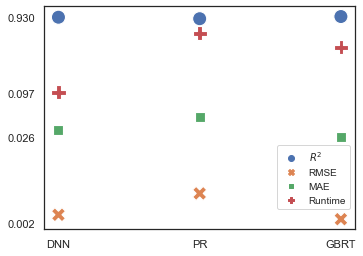

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# %matplotlib inline
df_compare_hyper_tuning = pd.read_csv('Dataset for metamodeling/data_Fig7.csv')
sns.set_theme(style="white")
fig_lineplot = plt.figure(figsize=(5,3.5))
fig_lineplot = sns.scatterplot(
    data=df_compare_hyper_tuning,
    x="Metamodel", y="Values", hue="Metrics", style="Metrics",
    markers=True, s=200)

fig_lineplot.set(ylabel='')
fig_lineplot.set(xlabel='')
plt.yscale('log')
fig_lineplot.set_yticks([.002, .026, .097, 0.93])
fig_lineplot.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
fig_lineplot.legend(fontsize=10,loc='upper right', bbox_to_anchor=(1, 0.4));

plt.tight_layout(pad=0.4, w_pad=1, h_pad=1.5)
# plt.savefig('Outputs/Line plot to compare tuning of hyperparams.eps', dpi=800)
# plt.savefig('Outputs/Line plot to compare tuning of hyperparams.tiff', dpi=800)
plt.savefig('Figures 05.2021/Figure7_PerformanceMetric_600.jpeg', dpi=1500)
plt.savefig('Figures 05.2021/Figure7_PerformanceMetric.eps', dpi=600)
plt.show()

# DNN model equation

In [12]:
dnn_best_model.coefs_

[array([[-5.81719789e-038,  5.93300641e-002, -2.41056584e-003,
          9.25536490e-002, -7.53557826e-165,  2.26623776e-002,
         -1.72160747e-001,  2.38351152e-001, -1.89365868e-002,
         -1.34569393e-002, -2.70415679e-001,  1.85885486e-002,
          1.29124663e-001,  8.68806466e-003, -1.74365183e-001,
          2.00879800e-002,  1.46474318e-001,  1.11724977e+000,
         -7.86753223e-002, -3.19634374e-003,  2.99835240e-164,
         -8.35992550e-001, -7.00647906e-039,  9.90614492e-002,
         -8.09142333e-002, -4.79697000e-003,  3.15883047e-001,
         -1.45245273e-002, -1.26343026e-014, -1.44565120e-001,
          4.59294308e-001, -6.71812991e-002,  4.48811288e-001,
         -9.51107485e-001, -7.17769212e-165,  1.30151044e-002,
          3.50298975e-001, -1.07765282e-001,  3.00679211e-002,
         -2.45321297e-002,  4.97877512e-164,  5.75139828e-003,
          2.13769190e-002, -4.47830217e-002, -1.52756025e-001,
          1.23032893e-001, -1.52697257e-001,  7.4358240

## Variable importance

In [13]:
X_train_dev.columns

Index(['$type_A$', '$type_B$', '$type_{oil}$', '$velocity_A$', '$velocity_B$',
       '$angle_{collision}$', '$location_{impact.B}$', '$displacement_A$',
       '$displacement_B$', '$length_B$', '$width_B$'],
      dtype='object')

In [14]:
# damage
y_train_dev_damage_ext1 = pd.DataFrame(y_train_dev, columns=['$height_{damage.ih}$'] )
y_test_damage_ext1 =   pd.DataFrame(y_test, columns=['$height_{damage.ih}$']  )
y_train_dev_damage_ext2 = pd.DataFrame(y_train_dev, columns=['$length_{damage.ih}$'] )
y_test_damage_ext2 =   pd.DataFrame(y_test, columns=['$length_{damage.ih}$']  )
y_train_dev_damage_ext3 = pd.DataFrame(y_train_dev, columns=['$height_{damage.oh}$'] )
y_test_damage_ext3 =   pd.DataFrame(y_test, columns=['$height_{damage.oh}$']  )
y_train_dev_damage_ext4 = pd.DataFrame(y_train_dev, columns=['$length_{damage.oh}$'] )
y_test_damage_ext4 =   pd.DataFrame(y_test, columns=['$length_{damage.oh}$']  )

# volume
y_train_dev_volume1 = pd.DataFrame(y_train_dev, columns=['$volume_{oo.15min}$'] )
y_test_volume1 =   pd.DataFrame(y_test, columns=['$volume_{oo.15min}$'] )
y_train_dev_volume2 = pd.DataFrame(y_train_dev, columns=[ '$volume_{oo.60min}$'] )
y_test_volume2 =   pd.DataFrame(y_test, columns=['$volume_{oo.60min}$'] )
y_train_dev_volume3 = pd.DataFrame(y_train_dev, columns=['$volume_{oo.total}$'] )
y_test_volume3 =   pd.DataFrame(y_test, columns=[ '$volume_{oo.total}$'] )



In [15]:
from sklearn.inspection import permutation_importance
dnn_best_model = MLPRegressor(hidden_layer_sizes=(64,64), learning_rate_init=0.009)
df_variable_importance = pd.DataFrame()
df_variable_importance['Column names'] = X_test.columns

# damage extents
dnn_best_model_damage1 = dnn_best_model.fit(X_train_dev, y_train_dev_damage_ext1)
variable_importance_damage1 = permutation_importance(dnn_best_model_damage1, X_test, y_test_damage_ext1, n_repeats=2, random_state=101)
df_variable_importance['Variable importance: Damage1'] = variable_importance_damage1.importances_mean

dnn_best_model_damage2 = dnn_best_model.fit(X_train_dev, y_train_dev_damage_ext2)
variable_importance_damage2 = permutation_importance(dnn_best_model_damage2, X_test, y_test_damage_ext2, n_repeats=2, random_state=101)
df_variable_importance['Variable importance: Damage2'] = variable_importance_damage2.importances_mean
dnn_best_model_damage3 = dnn_best_model.fit(X_train_dev, y_train_dev_damage_ext3)
variable_importance_damage3 = permutation_importance(dnn_best_model_damage3, X_test, y_test_damage_ext3, n_repeats=2, random_state=101)
df_variable_importance['Variable importance: Damage3'] = variable_importance_damage3.importances_mean
dnn_best_model_damage4 = dnn_best_model.fit(X_train_dev, y_train_dev_damage_ext4)
variable_importance_damage4 = permutation_importance(dnn_best_model_damage4, X_test, y_test_damage_ext4, n_repeats=2, random_state=101)
df_variable_importance['Variable importance: Damage4'] = variable_importance_damage4.importances_mean

# volume of oil
dnn_best_model_volume1 = dnn_best_model.fit(X_train_dev, y_train_dev_volume1)
variable_importance_volume1 = permutation_importance(dnn_best_model_volume1, X_test, y_test_volume1, n_repeats=2, random_state=101)
df_variable_importance['Variable importance: Volume1'] = variable_importance_volume1.importances_mean

dnn_best_model_volume2 = dnn_best_model.fit(X_train_dev, y_train_dev_volume2)
variable_importance_volume2 = permutation_importance(dnn_best_model_volume2, X_test, y_test_volume2, n_repeats=2, random_state=101)
df_variable_importance['Variable importance: Volume2'] = variable_importance_volume2.importances_mean

dnn_best_model_volume3 = dnn_best_model.fit(X_train_dev, y_train_dev_volume3)
variable_importance_volume3 = permutation_importance(dnn_best_model_volume3, X_test, y_test_volume3, n_repeats=2, random_state=101)
df_variable_importance['Variable importance: Volume3'] = variable_importance_volume3.importances_mean

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


In [16]:
df_variable_importance_sorted = df_variable_importance.sort_values(by=['Variable importance: Damage1'], ascending=False)
df_variable_importance_sorted.to_csv('Output 04.2021/df_variable_importance_sorted.csv')
display(df_variable_importance)
display(df_variable_importance_sorted)


,Column names,Variable importance: Damage1,Variable importance: Damage2,Variable importance: Damage3,Variable importance: Damage4,Variable importance: Volume1,Variable importance: Volume2,Variable importance: Volume3
0,$type_A$,0.520339,0.563634,1.288960,0.852588,0.801493,0.459595,0.378527
1,$type_B$,0.090913,0.054351,0.072926,0.034552,0.060656,0.071013,0.059270
2,$type_{oil}$,0.000072,0.000046,0.000232,0.001694,0.001059,0.000099,-0.000039
3,$velocity_A$,0.668618,0.500539,0.448981,0.327694,0.544492,0.517023,0.530246
4,$velocity_B$,0.107488,0.077849,0.078773,0.048539,0.067671,0.062385,0.065579
5,$angle_{collision}$,0.539047,0.426641,0.337213,0.299791,0.526466,0.480779,0.524621
6,$location_{impact.B}$,0.090156,0.091220,0.071195,0.074448,0.303200,0.283454,0.302577
7,$displacement_A$,0.480981,0.896381,1.167005,1.021499,1.038754,0.702325,0.521798
8,$displacement_B$,0.729814,0.967098,0.816007,1.587214,0.728001,0.512051,0.693530
9,$length_B$,0.224260,0.256949,0.340059,0.306906,0.262546,0.248088,0.249619


,Column names,Variable importance: Damage1,Variable importance: Damage2,Variable importance: Damage3,Variable importance: Damage4,Variable importance: Volume1,Variable importance: Volume2,Variable importance: Volume3
8,$displacement_B$,0.729814,0.967098,0.816007,1.587214,0.728001,0.512051,0.693530
3,$velocity_A$,0.668618,0.500539,0.448981,0.327694,0.544492,0.517023,0.530246
5,$angle_{collision}$,0.539047,0.426641,0.337213,0.299791,0.526466,0.480779,0.524621
0,$type_A$,0.520339,0.563634,1.288960,0.852588,0.801493,0.459595,0.378527
10,$width_B$,0.502408,0.685634,0.874343,0.880465,0.288260,0.297780,0.339270
7,$displacement_A$,0.480981,0.896381,1.167005,1.021499,1.038754,0.702325,0.521798
9,$length_B$,0.224260,0.256949,0.340059,0.306906,0.262546,0.248088,0.249619
4,$velocity_B$,0.107488,0.077849,0.078773,0.048539,0.067671,0.062385,0.065579
1,$type_B$,0.090913,0.054351,0.072926,0.034552,0.060656,0.071013,0.059270
6,$location_{impact.B}$,0.090156,0.091220,0.071195,0.074448,0.303200,0.283454,0.302577


In [17]:
index =['$type_A$', '$type_B$', '$type_{oil}$', '$velocity_A$', '$velocity_B$',
       '$angle_{collision}$', '$location_{impact.B}$', '$displacement_A$',
       '$displacement_B$', '$length_B$', '$width_B$']
df_barH = df_variable_importance
df_barH.index = index
print(df_barH.columns)
#'$height_{damage.ih}$','$length_{damage.ih}$','$height_{damage.oh}$','$length_{damage.oh}$'

#'$volume_{oo.15min}$','$volume_{oo.60min}$','$volume_{oo.total}$'

Index(['Column names', 'Variable importance: Damage1',
       'Variable importance: Damage2', 'Variable importance: Damage3',
       'Variable importance: Damage4', 'Variable importance: Volume1',
       'Variable importance: Volume2', 'Variable importance: Volume3'],
      dtype='object')


In [18]:
df_barh2 = df_barH.drop(['Column names'], axis=1)
df_barh2

,Variable importance: Damage1,Variable importance: Damage2,Variable importance: Damage3,Variable importance: Damage4,Variable importance: Volume1,Variable importance: Volume2,Variable importance: Volume3
$type_A$,0.520339,0.563634,1.288960,0.852588,0.801493,0.459595,0.378527
$type_B$,0.090913,0.054351,0.072926,0.034552,0.060656,0.071013,0.059270
$type_{oil}$,0.000072,0.000046,0.000232,0.001694,0.001059,0.000099,-0.000039
$velocity_A$,0.668618,0.500539,0.448981,0.327694,0.544492,0.517023,0.530246
$velocity_B$,0.107488,0.077849,0.078773,0.048539,0.067671,0.062385,0.065579
$angle_{collision}$,0.539047,0.426641,0.337213,0.299791,0.526466,0.480779,0.524621
$location_{impact.B}$,0.090156,0.091220,0.071195,0.074448,0.303200,0.283454,0.302577
$displacement_A$,0.480981,0.896381,1.167005,1.021499,1.038754,0.702325,0.521798
$displacement_B$,0.729814,0.967098,0.816007,1.587214,0.728001,0.512051,0.693530
$length_B$,0.224260,0.256949,0.340059,0.306906,0.262546,0.248088,0.249619


In [19]:
df_barh3 = df_barh2.rename(columns={"Variable importance: Damage1": "$height_{damage.ih}$", "Variable importance: Damage2": "$length_{damage.ih}$",
                       "Variable importance: Damage3": "$height_{damage.oh}$", "Variable importance: Damage4":"$length_{damage.oh}$",
                       "Variable importance: Volume1":"$volume_{oo.15min}$", "Variable importance: Volume2":"$volume_{oo.60min}$", 
                       "Variable importance: Volume3": "$volume_{oo.total}$"})

In [20]:
df_barh3.columns

Index(['$height_{damage.ih}$', '$length_{damage.ih}$', '$height_{damage.oh}$',
       '$length_{damage.oh}$', '$volume_{oo.15min}$', '$volume_{oo.60min}$',
       '$volume_{oo.total}$'],
      dtype='object')

# Figure 10

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 3600x2400 with 0 Axes>

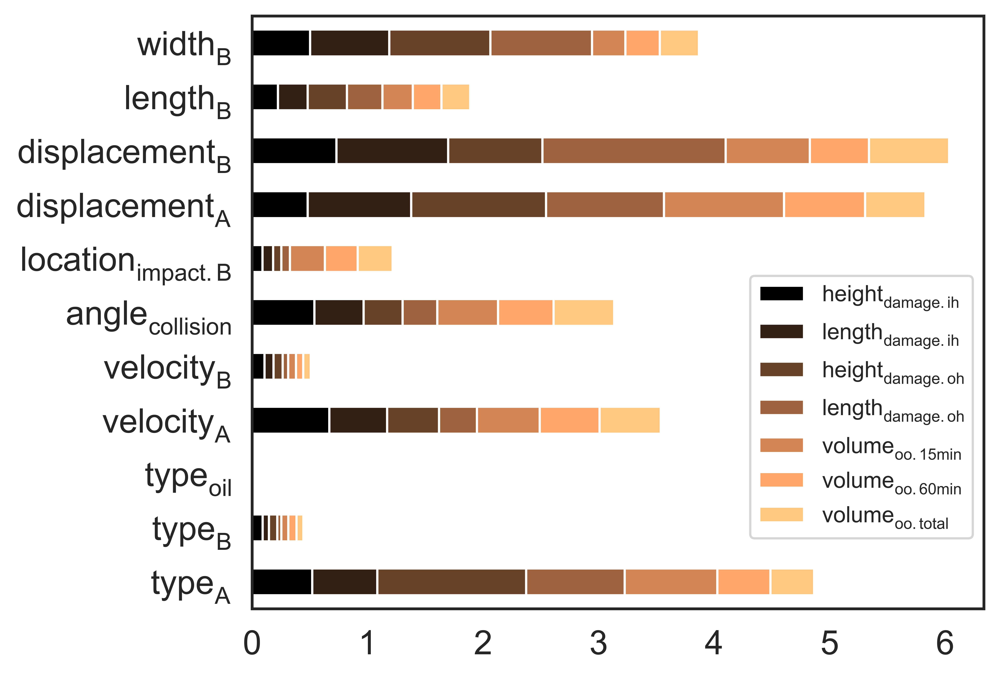

In [25]:
sns.set_theme(style="white")
plt.figure()
#barh_fig = df_barh3.plot.barh(stacked=True, fontsize=15)
barh_fig = df_barh3.plot.barh(stacked=True, fontsize=15, colormap='copper')
#color={'$height_{damage.ih}$': 'green', '$height_{damage.oh}$': '.1'})
#df.plot.barh(y='speed')
barh_fig.legend(fontsize=10,loc="lower right", bbox_to_anchor=(1, 0.1)); # fig_lineplot.legend(fontsize=10,loc='upper right', bbox_to_anchor=(1, 0.4));
# df_barh3.legend(ncol=1,  loc="lower right", frameon=True, fontsize=12)
# https://matplotlib.org/stable/tutorials/colors/colormaps.html

plt.tight_layout(pad=0, w_pad=0, h_pad=0)
plt.savefig('Figures 05.2021/Figure10_hbar plot variable importance.jpeg')
plt.savefig('Figures 05.2021/Figure10_hbar plot variable importance.eps', dpi=600)


# Fit models in each output

In [66]:
y_train_dev_vol_1 = y_train_dev['$volume_{oo.15min}$']
y_test_vol_1 = y_test['$volume_{oo.15min}$']

y_train_dev_damage_1 = y_train_dev['$height_{damage.ih}$']
y_test_damage_1 = y_test['$height_{damage.ih}$']

In [67]:
from sklearn.inspection import permutation_importance

dnn_best_model_dam = MLPRegressor(hidden_layer_sizes=(32,32), learning_rate_init=0.005)
dnn_best_model_dam.fit(X_train_dev, y_train_dev_damage_1)
variable_importance_result = permutation_importance(dnn_best_model_dam, X_test,y_test_damage_1 , n_repeats=3,
                                random_state=110)
perm_sorted_idx = variable_importance_result.importances_mean.argsort()

#sns.set_theme(style="whitegrid")
df_variable_importance = pd.DataFrame()
df_variable_importance['Variable importance value'] = variable_importance_result.importances_mean
df_variable_importance['Column names'] = X_test.columns
display(df_variable_importance)

,Variable importance value,Column names
0,0.085839,$type_A$
1,0.008060,$type_B$
2,0.967906,$type_{oil}$
3,0.270829,$velocity_A$
4,0.043085,$velocity_B$
5,0.195300,$angle_{collision}$
6,0.053868,$location_{impact.B}$
7,0.147954,$displacement_A$
8,0.145269,$displacement_B$
9,0.218258,$length_B$


In [ ]:
# Try volume only prediction!! 
# volume
y_train_dev_volume = pd.DataFrame(y_train_dev, columns=['$volume_{oo.15min}$' , '$volume_{oo.60min}$', '$volume_{oo.total}$'])
y_test_volume  = pd.DataFrame(y_test, columns=['$volume_{oo.15min}$' , '$volume_{oo.60min}$', '$volume_{oo.total}$'])

# Build & Train the model
dnn_best_model_volume = MLPRegressor(hidden_layer_sizes=(64,64), learning_rate_init=0.009)
# Train with training data
dnn_best_model_volume.fit(X_train_dev, y_train_dev_volume)

gbrt_best_model_volume = MultiOutputRegressor(GradientBoostingRegressor(learning_rate=.2, max_depth=10, n_estimators=20))
gbrt_best_model_volume.fit(X_train_dev,y_train_dev_volume)

# Build & Train the model
pr_best_model_volume = make_pipeline(PolynomialFeatures(degree=4),
                      LinearRegression())
pr_best_model_volume.fit(X_train_dev,y_train_dev_volume)

# Pareto Front

## Dataset for Pareto Front

In [62]:
# Accidental cases
# data
X_test = pd.read_csv('Dataset for metamodeling/X_test.csv', header=0)
y_test = pd.read_csv('Dataset for metamodeling/y_test.csv', header=0)

In [87]:
X_test.describe()
X_test_i = X_test.sample(n = 100) 
y_test_i = y_test.sample(n = 100) 
y_test_i.describe()

,$volume_{oo.15min}$,$volume_{oo.60min}$,$volume_{oo.total}$,$height_{damage.ih}$,$length_{damage.ih}$,$height_{damage.oh}$,$length_{damage.oh}$
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,0.073441,0.077270,0.078761,0.262703,0.213866,0.332805,0.262971
std,0.119245,0.122185,0.123217,0.315735,0.230085,0.309569,0.226218
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000015,0.000000
50%,0.007149,0.007279,0.007381,0.099773,0.145511,0.313321,0.271705
75%,0.116048,0.122930,0.123675,0.517282,0.371236,0.538154,0.413505
max,0.564358,0.564358,0.564358,1.000000,0.820212,1.000000,0.819607


MultiOutputRegressor(estimator=GradientBoostingRegressor(learning_rate=0.2,
                                                         max_depth=10,
                                                         n_estimators=20))

In [89]:
X_test.describe()
X_test_i = X_test.sample(n = 10) 
y_test_i = y_test.sample(n = 10) 
y_test_i.describe()

#DNN
start_point_pr = time.time() #runtime start
y_pred_i = dnn_best_model.predict(X_test_i)
runtime_dnn_i = time.time() - start_point_pr
# Test the model
rmse_dnn_i = mean_squared_error(y_test_i, y_pred_i, squared=True)
r2_dnn_i = r2_score(y_test_i, y_pred_i)
print('r2_pr, rmse_pr, runtime_pr',r2_dnn_i, rmse_dnn_i,  runtime_dnn_i)

#PR
start_point_pr = time.time() #runtime start
y_pred_i = pr_best_model.predict(X_test_i)
runtime_pr_i = time.time() - start_point_pr
# Test the model
rmse_pr_i = mean_squared_error(y_test_i, y_pred_i, squared=True)
r2_pr_i = r2_score(y_test_i, y_pred_i)
print('r2_pr, rmse_pr, runtime_pr',r2_pr_i, rmse_pr_i,  runtime_pr_i)

#GBRT
start_point_pr = time.time() #runtime start
y_pred_i = gbrt_best_model.predict(X_test_i)
runtime_gbrt_i = time.time() - start_point_pr
# Test the model
rmse_gbrt_i = mean_squared_error(y_test_i, y_pred_i, squared=True)
r2_gbrt_i = r2_score(y_test_i, y_pred_i)
print('r2_gbrt, rmse_gbrt, runtime_gbrt', r2_gbrt_i, rmse_gbrt_i,  runtime_gbrt_i)

r2_pr, rmse_pr, runtime_pr -2.8397092246703837 0.06352519958643535 0.0019927024841308594
r2_pr, rmse_pr, runtime_pr -2.6479611203638895 0.061919440256558024 0.0030031204223632812
r2_gbrt, rmse_gbrt, runtime_gbrt -2.7480131364814833 0.061918293111490795 0.006012439727783203


In [91]:
metamodel = [None] * 90
metamodel[0:30] = ['DNN'] * 30
metamodel[30:60] = ['PR'] * 30
metamodel[60:90] = ['GBRT'] * 30

Runtime =[]
RMSE = []
for i in range (30):
    X_test_i = X_test.iloc[i*10:(i+1)*10,] #X_test.sample(n = 10) 
    y_test_i = y_test.iloc[i*10:(i+1)*10,] # y_test.sample(n = 10) 
    
    start_point_pr = time.time() #runtime start
    y_pred_i = dnn_best_model.predict(X_test_i)
    runtime_i = time.time() - start_point_pr
    rmse_i = mean_squared_error(y_test_i, y_pred_i, squared=True)
    Runtime.append(runtime_i)
    RMSE.append(rmse_i)
    
for i in range (30):
    X_test_i = X_test.iloc[i*10:(i+1)*10,] #X_test.sample(n = 10) 
    y_test_i = y_test.iloc[i*10:(i+1)*10,] # y_test.sample(n = 10) 
        
    start_point_pr = time.time() #runtime start
    y_pred_i = pr_best_model.predict(X_test_i)
    rmse_i = mean_squared_error(y_test_i, y_pred_i, squared=True)
    runtime_i = time.time() - start_point_pr
    Runtime.append(runtime_i)
    RMSE.append(rmse_i)
    
for i in range (30):
    X_test_i = X_test.iloc[i*10:(i+1)*10,] #X_test.sample(n = 10) 
    y_test_i = y_test.iloc[i*10:(i+1)*10,] # y_test.sample(n = 10) 
        
    start_point_pr = time.time() #runtime start
    y_pred_i = gbrt_best_model.predict(X_test_i)
    rmse_i = mean_squared_error(y_test_i, y_pred_i, squared=True)
    runtime_i = time.time() - start_point_pr
    Runtime.append(runtime_i)
    RMSE.append(rmse_i)

In [93]:
df_pareto_front = pd.DataFrame([metamodel, RMSE, Runtime]).T
df_pareto_front.columns = ['metamodel', 'RMSE', 'Runtime']
df_pareto_front

,metamodel,RMSE,Runtime
0,DNN,0.0018923,0.00200224
1,DNN,0.00277309,0.00100279
2,DNN,0.00313314,0.0010035
3,DNN,0.00268647,0.00200582
4,DNN,0.0048247,0.00199723
...,...,...,...
85,GBRT,0.00107734,0.00397635
86,GBRT,0.00367244,0.00500369
87,GBRT,0.00150728,0.00700021
88,GBRT,0.00137539,0.00399971


In [94]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Some dummy data: Each item has two scores
df_pareto = df_pareto_front# pd.read_excel('Data 04.2021/Data 04.04.2021/data_paretofront_dnn_pr_gbrt.xlsx', sheet_name='Sheet4').copy()
scores = df_pareto.to_numpy()
x = scores[:, 1]
y = scores[:, 2]
#display(x)
df_pareto.describe()

,metamodel,RMSE,Runtime
count,90,90.00000,90.000
unique,3,90.00000,79.000
top,GBRT,0.00331,0.003
freq,30,1.00000,3.000


In [95]:
def identify_pareto(scores):
    # Count number of items
    population_size = scores.shape[0]
    # Create a NumPy index for scores on the pareto front (zero indexed)
    population_ids = np.arange(population_size)
    # Create a starting list of items on the Pareto front
    # All items start off as being labelled as on the Parteo front
    pareto_front = np.ones(population_size, dtype=bool)
    # Loop through each item. This will then be compared with all other items
    for i in range(population_size):
        # Loop through all other items
        for j in range(population_size):
            # Check if our 'i' pint is dominated by out 'j' point
            if all(scores[j] <= scores[i]) and any(scores[j] < scores[i]):  #both minimize
          #  if all(scores[j] >= scores[i]) and all(scores[j] > scores[i]):  
            #       if all(scores[j] >= scores[i]) and any(scores[j] > scores[i]): both maximize
         
                # j dominates i. Label 'i' point as not on Pareto front
                pareto_front[i] = 0
                # Stop further comparisons with 'i' (no more comparisons needed)
                break
    # Return ids of scenarios on pareto front
    return population_ids[pareto_front]

pareto = identify_pareto(scores)
print ('Pareto front index vales')
print ('Points on Pareto front: \n',pareto)

pareto_front = scores[pareto]
print ('\nPareto front scores')
print (pareto_front)


Pareto front index vales
Points on Pareto front: 
 [ 8  9 11 13 20 78]

Pareto front scores
[['DNN' 0.00097109799265565 0.0020020008087158203]
 ['DNN' 0.001257722389275325 0.000997304916381836]
 ['DNN' 0.001192084548116723 0.0019843578338623047]
 ['DNN' 0.0012670468636101838 0.0009961128234863281]
 ['DNN' 0.005015552606880962 0.0009856224060058594]
 ['GBRT' 0.00026880362138409774 0.0040035247802734375]]


In [96]:
pareto_front_df = pd.DataFrame(pareto_front)
pareto_front_df.sort_values(0, inplace=True)
pareto_front = pareto_front_df.values
x_all = scores[:, 1]
y_all = scores[:, 2]
x_pareto = pareto_front[:, 1]
y_pareto = pareto_front[:, 2]

#plt.scatter(x_all, y_all)
#plt.plot(x_pareto, y_pareto,'bo', color='r')
#plt.xlabel('Objective A')
#plt.ylabel('Objective B')
#plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

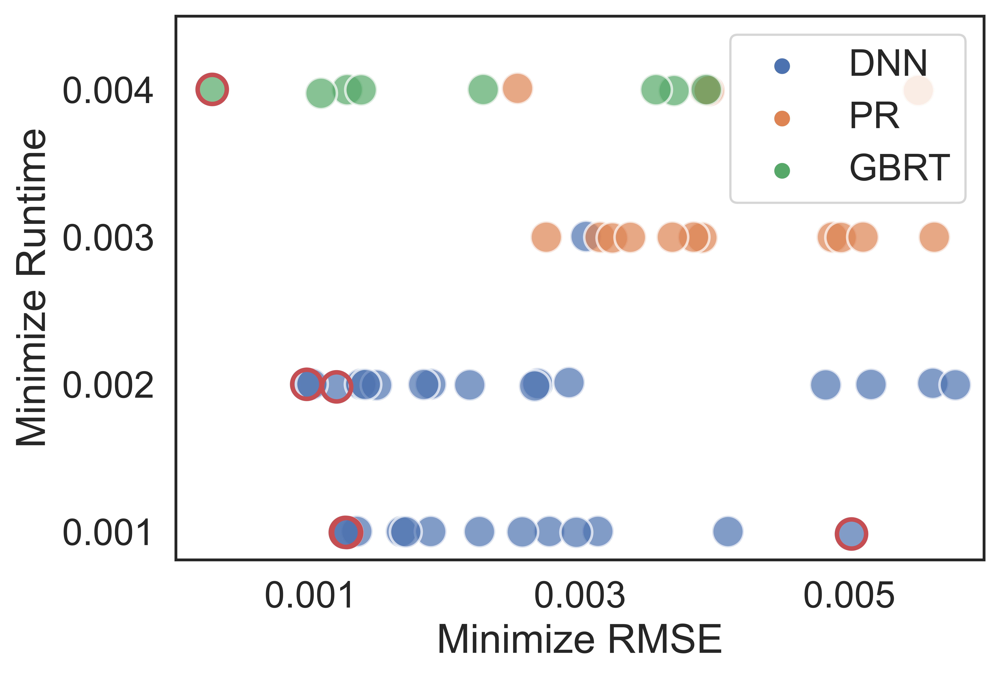

In [108]:
import pandas
from matplotlib.ticker import FormatStrFormatter
df_pareto = df_pareto_front
import seaborn as sns
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(6,4))
sns.set_style("white")

fig = sns.scatterplot(x='RMSE', y='Runtime', data=df_pareto, alpha=0.7, hue='metamodel', s=200)
plt.plot(x_pareto, y_pareto,'o', markerfacecolor='None', markersize=13, markeredgecolor='r',  markeredgewidth=2)
#plt.plot(x_pareto, y_pareto,'bo', markerfacecolor='black', markersize=3)

fig.yaxis.set_ticks(np.arange(.001, .003, .0005))

plt.xlabel('Minimize RMSE')
plt.ylabel('Minimize Runtime')
plt.xlim(0.0,0.006)
plt.ylim(0.00081, 0.0045)
#fig.ticklabel_format(axis="x", style="sci", scilimits=(3,3))
fig.xaxis.set_major_formatter(FormatStrFormatter('%.1f'))
fig.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

#fig.set_xscale('log');# fig.set_yscale('log')
fig.set_xticks([.001, .003,.005])
fig.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

fig.set_yticks([.001, .002, .003, .004])
fig.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
#fig.ticklabel_format(axis="y", style="sci", scilimits=(-3,-3))
plt.legend(loc='upper right')

plt.tight_layout(pad=0, w_pad=0, h_pad=0)
sns.set(font_scale = 1.5)
plt.savefig('Figures 05.2021/Figure8_Pareto Front.jpeg', dpi=900)
plt.savefig('Figures 05.2021/Figure8_Pareto Front.eps', dpi=900)
plt.show()


In [109]:
df_pareto_front

,metamodel,RMSE,Runtime
0,DNN,0.0018923,0.00200224
1,DNN,0.00277309,0.00100279
2,DNN,0.00313314,0.0010035
3,DNN,0.00268647,0.00200582
4,DNN,0.0048247,0.00199723
...,...,...,...
85,GBRT,0.00107734,0.00397635
86,GBRT,0.00367244,0.00500369
87,GBRT,0.00150728,0.00700021
88,GBRT,0.00137539,0.00399971


In [16]:
X_train_dev1 = X_train_dev#.sample(n = 20000) 
y_train_volume_total = y_train_dev.iloc[:,2]#.sample(n = 20000) 
y_test_volume_total = y_test.iloc[:,2]#.sample(n = 20000) 

In [15]:
y_test_volume_total

0        0.000000
1        0.000000
2        0.246409
3        0.000000
4        0.037571
           ...   
20795    0.294687
20796    0.017258
20797    0.287001
20798    0.000000
20799    0.371201
Name: $volume_{oo.total}$, Length: 20800, dtype: float64

In [29]:
import time
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_validate, cross_val_predict
import  numpy as np
from sklearn.pipeline import make_pipeline
from sklearn.neural_network import MLPRegressor

estimators = [('Model: DNN',  MLPRegressor(hidden_layer_sizes=(64, 64), learning_rate_init=0.009)),
              ('Model: PR', make_pipeline(PolynomialFeatures(degree=4), LinearRegression())),
              ('Model: GBRT', GradientBoostingRegressor(max_depth = 10, learning_rate=0.448, n_estimators=5, random_state=0))]

def plot_regression_results(ax, y_true, y_pred, title, scores, elapsed_time):
    """Scatter plot of the predicted vs true targets."""
    ax.plot([y_true.min(), y_true.max()],
            [y_true.min(), y_true.max()],
            '--r', linewidth=2)
    ax.scatter(y_true.values.reshape((len(y_true), 1)), y_pred, alpha=0.2) #y_train.iloc[:,2].values.reshape((len(y_train), 1))

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.get_xaxis().tick_bottom()
    ax.get_yaxis().tick_left()
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
 #   ax.set_xlim([y_true.min(), y_true.max()+1000]) # ?
  #  ax.set_ylim([y_true.min(), y_true.max()+1000]) #??
   #
    ax.set_ylabel('Predicted')
    extra = plt.Rectangle((0, 0), 0, 0, fc="w", fill=False,
                          edgecolor='none', linewidth=0)
    ax.legend([extra], [scores], loc='upper left')
    title = title #+ ' (Evaluation in {:.2f} seconds)'.format(elapsed_time)
    ax.set_title(title)


fig, axs = plt.subplots(3, 1, figsize=(6, 12))
axs = np.ravel(axs)
plt.xlabel('Measured', size=11)

for ax, (name, est) in zip(axs, estimators ):
    start_time = time.time()
    score = cross_validate(est, X_train_dev1, y_train_volume_total,
                           scoring=['r2', 'neg_root_mean_squared_error'],
                           n_jobs=30, verbose=0)
    elapsed_time = time.time() - start_time

    y_pred = cross_val_predict(est, X_train_dev1, y_train_volume_total, n_jobs=30, verbose=0) #.iloc[:,2]

    plot_regression_results(
        ax, y_train_volume_total, y_pred,
        name,
        (r'$R^2={:.2f} \pm {:.2f}$' + '\n' + r'$RMSE={:.2f} \pm {:.2f}$')
        .format(np.mean(score['test_r2']),
                np.std(score['test_r2']),
                -np.mean(score['test_neg_root_mean_squared_error']),
                np.std(score['test_neg_root_mean_squared_error'])),
        elapsed_time)

# plt.suptitle('Single predictors versus stacked predictors')
plt.tight_layout()
#plt.subplots_adjust(top=0.9)

plt.savefig('Figure11_Regression plot.jpg', dpi=800)
plt.show()

#y_train.iloc[:,2].shape
#y_train.iloc[:,2].values.reshape((len(y_train), 1)).dtype

In [19]:
estimators 

[('Model: DNN',
  MLPRegressor(hidden_layer_sizes=(64, 64), learning_rate_init=0.009)),
 ('Model: PR',
  Pipeline(steps=[('polynomialfeatures', PolynomialFeatures(degree=4)),
                  ('linearregression', LinearRegression())]),
  ('Model: GBRT',
   GradientBoostingRegressor(learning_rate=0.448, max_depth=10, n_estimators=5,
                             random_state=0)))]